# Introduction

**Ciera**:  For your introduction include an introduction to what PBDB, the paleobioDB package, who you are, and why you were interested in dataset. 
Hi, I am Yihui Zhu. I am born in 1998 and I am studying computer science in UCBerkley. I enjoy imagining what our earth was like millions of year ago as well as what it would be like and where we, human beings would live millions of years later.
PBDB is the abbreviation of Paleobiology Database. It contains data about palaeontology occurences with several dimensions like geological time period and locations. We can get the data from its R package and use some interesting features of this package to conduct our research. I decide to do my research based on this dataset because I have always been interested in palaeontology and it is awesome to know who is walking on the earth millions of years ago.
We are doing basic set up and explore with the 

PBDB data frame in this notebook. At the end, we will perform a visualization based on chronological orderings so that we are able to see two interesting immigration/evoluation patterns.

## Basic setup

If we are using an older version of the package, you would not be able to run some cool new functions that I use below. Download the API from the github with the most updated information.

In [4]:
#install.packages("paleobioDB")
library(devtools)
#library(tidyverse)
library(ggplot2)
install_github('ropensci/paleobioDB')
library(paleobioDB)

from URL https://api.github.com/repos/ropensci/paleobioDB/zipball/master
Installing paleobioDB
'/Library/Frameworks/R.framework/Resources/bin/R' --no-site-file --no-environ  \
  --no-save --no-restore --quiet CMD INSTALL  \
  '/private/var/folders/c3/bzm4vh_91zdbl5wz5zt4wn200000gn/T/RtmpKDdgPD/devtoolsf06829109ac0/ropensci-paleobioDB-f731aa6'  \
  --library='/Library/Frameworks/R.framework/Versions/3.4/Resources/library'  \
  --install-tests 

Loading required package: raster
Loading required package: sp
Loading required package: maps


**Ciera**: Include a dscription of what you are doing here.  Why did you get this collection? What is this function doing?
/.The cell below is a showcase.
It finds the information of a specific collection record with an id.
It is also an example about getting familiar with the package.

In [5]:
pbdb_collection (id=1003, vocab="pbdb", show="loc")

collection_no,record_type,formation,lng,lat,llp,collection_name,n_occs,early_interval,reference_no,cc,state,county
1003,collection,Cherokee Shale,-94.80417,37.33111,MS,"USGS 7848-Cherokee Co., Kansas",1,Desmoinesian,33,US,Kansas,Cherokee


**Ciera**: Explain what you are looking at only one site. /
This variable a is this only one single collection. 
We can see the information one single collection contains. We now know that one occurence is a collection of its location (lng stands for longtitude, lat stands for latitude). The type of rock of this record. Its reference number and distric of this occurence.
For example, a with is an occurence found in Cherokee, Kansas.

In [6]:
a <- pbdb_collection(id=1003, vocab="pbdb", show=c('loc'))
str(a)

'data.frame':	1 obs. of  13 variables:
 $ collection_no  : num 1003
 $ record_type    : Factor w/ 1 level "collection": 1
 $ formation      : Factor w/ 1 level "Cherokee Shale": 1
 $ lng            : num -94.8
 $ lat            : num 37.3
 $ llp            : Factor w/ 1 level "MS": 1
 $ collection_name: Factor w/ 1 level "USGS 7848-Cherokee Co., Kansas": 1
 $ n_occs         : num 1
 $ early_interval : Factor w/ 1 level "Desmoinesian": 1
 $ reference_no   : num 33
 $ cc             : Factor w/ 1 level "US": 1
 $ state          : Factor w/ 1 level "Kansas": 1
 $ county         : Factor w/ 1 level "Cherokee": 1


Put this data point in a global map

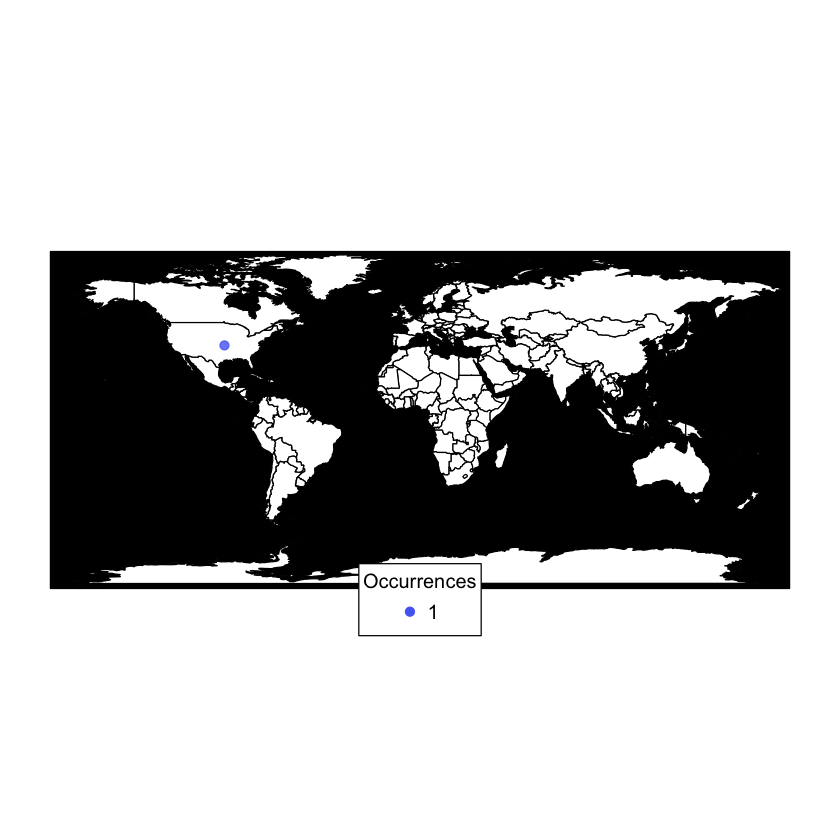

In [7]:
pbdb_map(a)

## Looking for all the Dinosaur families

x is all the dinasour class or family.

try and catch needs to be applied here. This is the link source of these names: https://en.wikipedia.org/wiki/Dinosaur_classification

In [8]:
x <- list('Abelisauridae', 'Noasauridae', 'Megalosauridae','Spinosauridae','Allosauridae',
           'Carcharodontosauridae','Neovenatoridae','Metriacanthosauridae','Coeluridae','Tyrannosauridae',
         'Ornithomimidae','Alvarezsauridae','Therizinosauridae','Troodontidae','Dromaeosauridae',
          'Aves','Thecodontosaurus','Plateosauridae','Riojasaurus','Massospondylidae',
          'Vulcanodontidae','Omeisauridae','Cetiosauridae','Diplodocidae','Camarasauridae',
          'Brachiosauridae','Euhelopodidae','Titanosauridae','Pisanosauridae','Fabrosauridae',
          'Scelidosauridae','Stegosauria','Nodosauridae','Ankylosauridae','Pachycephalosauria',
          'Psittacosauridae','Protoceratopsidae','Ceratopsidae','Heterodontosauridae','Hypsilophodontidae',
          'Iguanodontidae','Hadrosauridae'
         )


In the cell below, we are running the function that visualizes every species(so called) by pointing their occurences on the global map. A lot of run time required. I used try and catch because some species have little data and none value errors occured. I used try and catch to ignore errors and keep the loops running because the error is from lack of data so this error is trivial here. In other situations, try and catch is used to catch the possible [exceptions](https://www.ocf.berkeley.edu/~shidi/cs61a/wiki/Exception), so we are able to know the error and then debug.  This link is from CS61A and it is a brief introduction about the try and catch statement. 

**Ciera**: We can include the function below, but we should not print out the maps.  Pick one or two families to focus on first. Do you only have to use try and catch because you get errors when you visualize it? YOu don't need to use it below when you get the data, right? Maybe for this part we can show that you can get errors when focussing on certain families. Its kinda like pointing out faults in the pbdb_occurance() function when interacting with pddb_map().  What does occurance exactly mean?  The color pin to red part here....
I used the cell below to try to find some interesting and meaningful patterns. So maybe we can reduce the showing maps into those classes with certain amount of occurences?

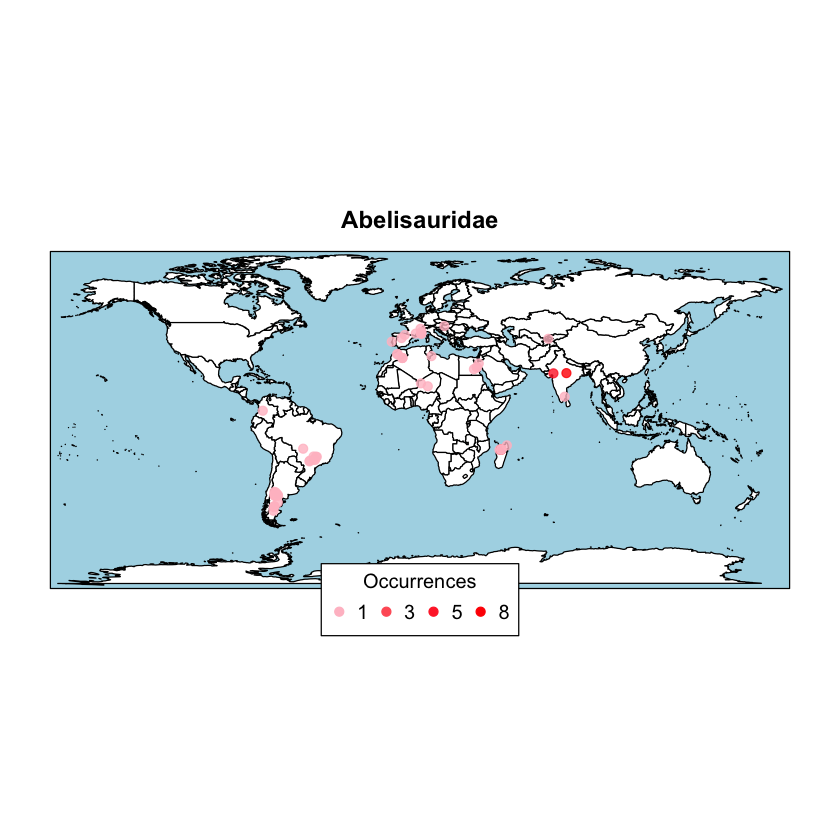

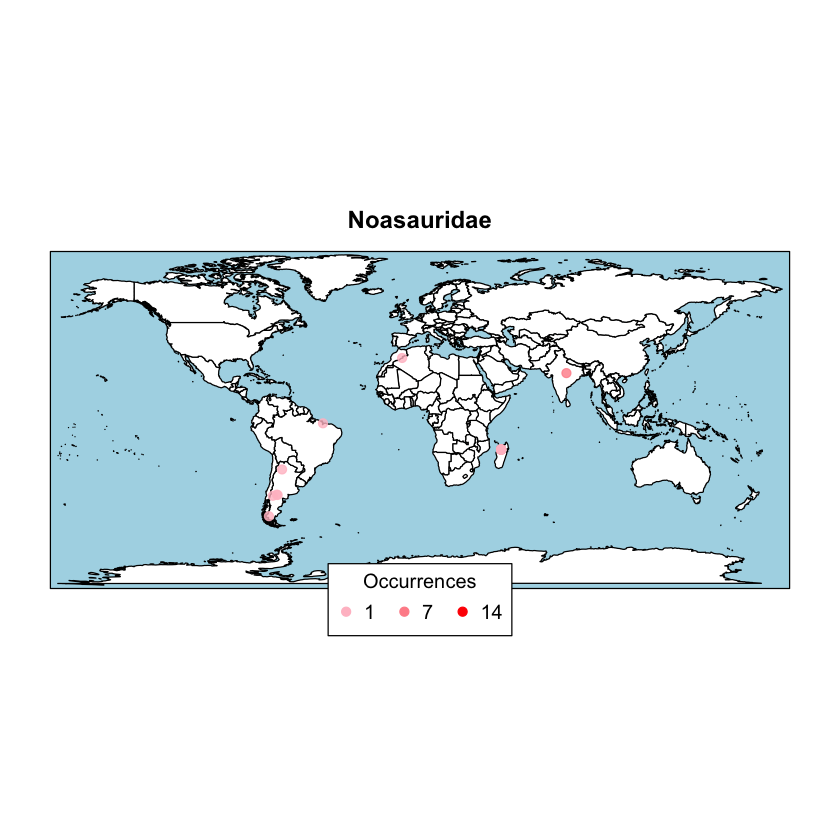

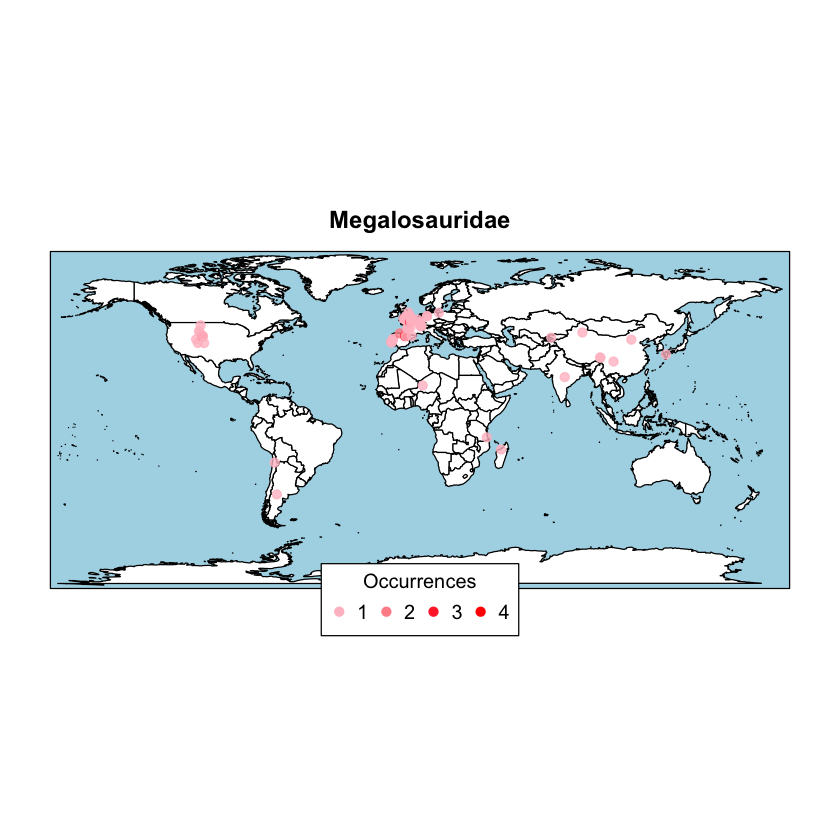

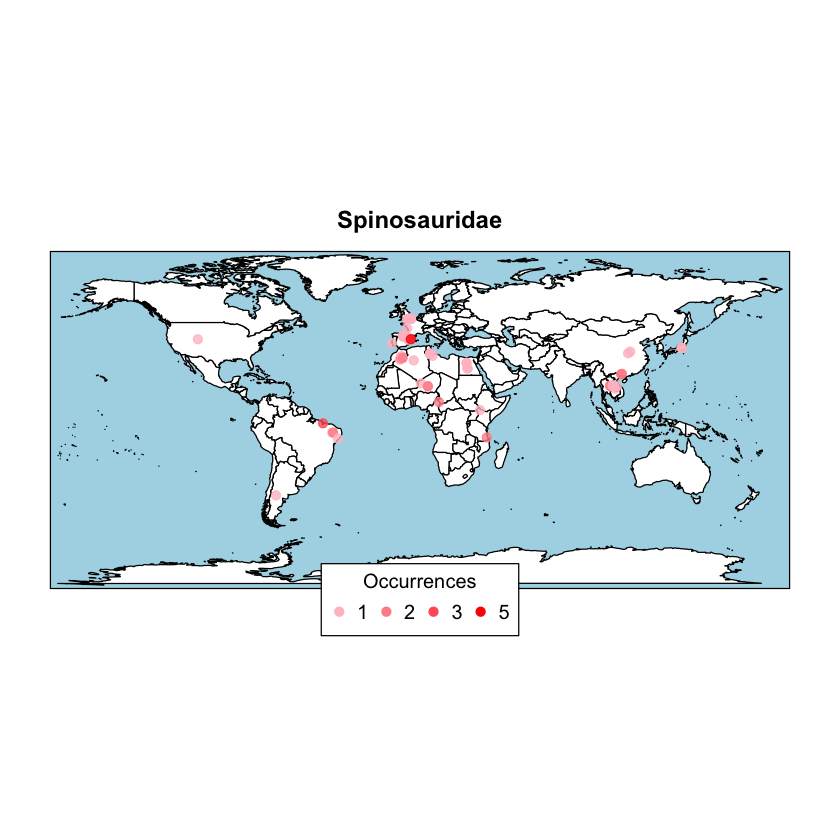

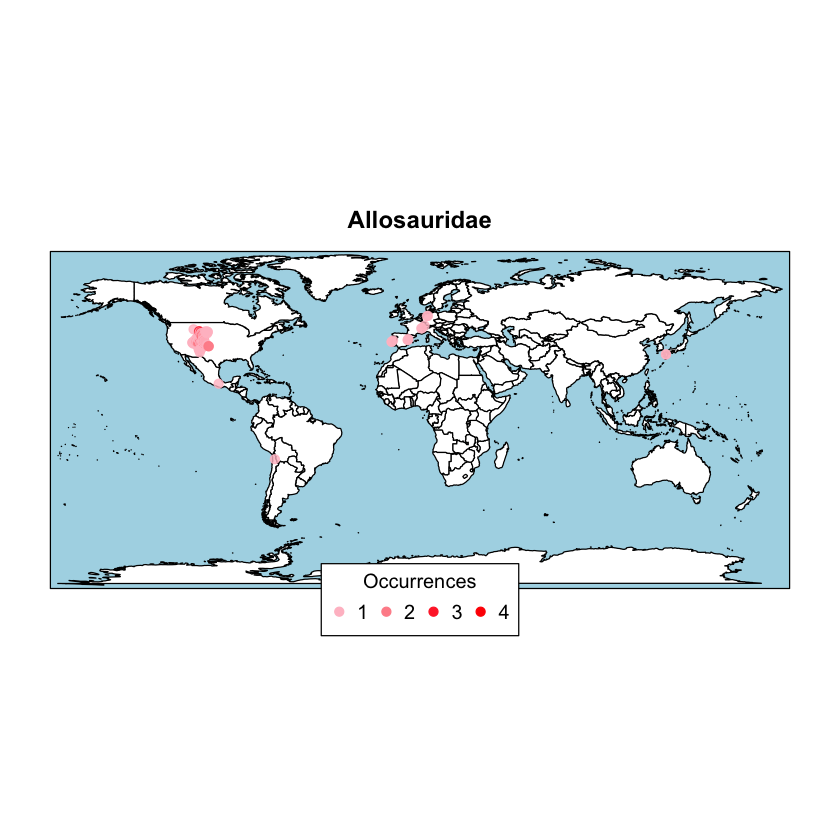

...

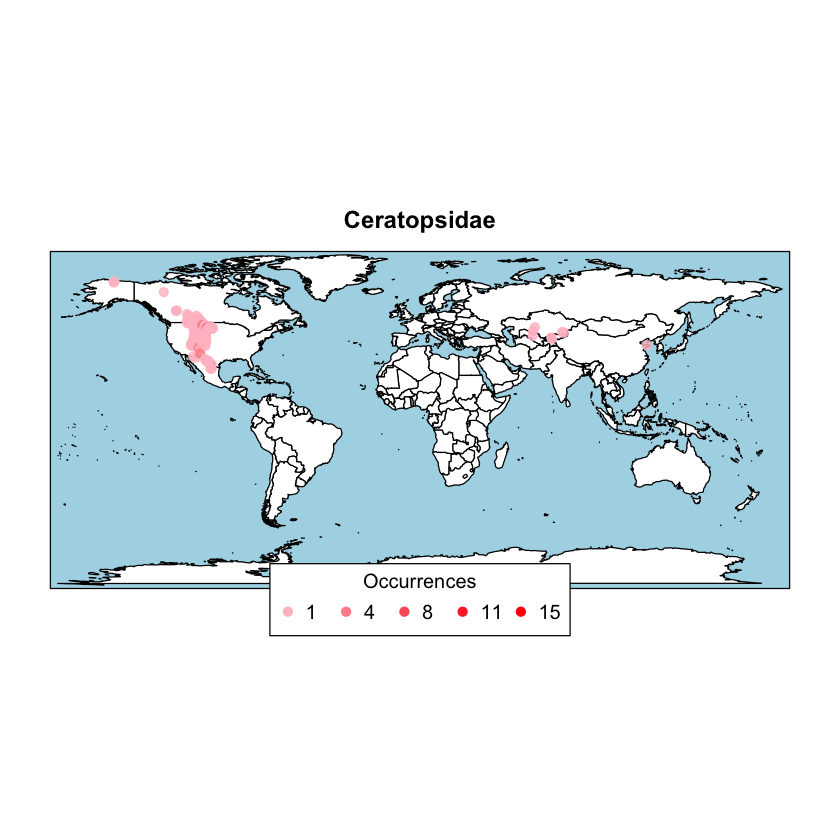

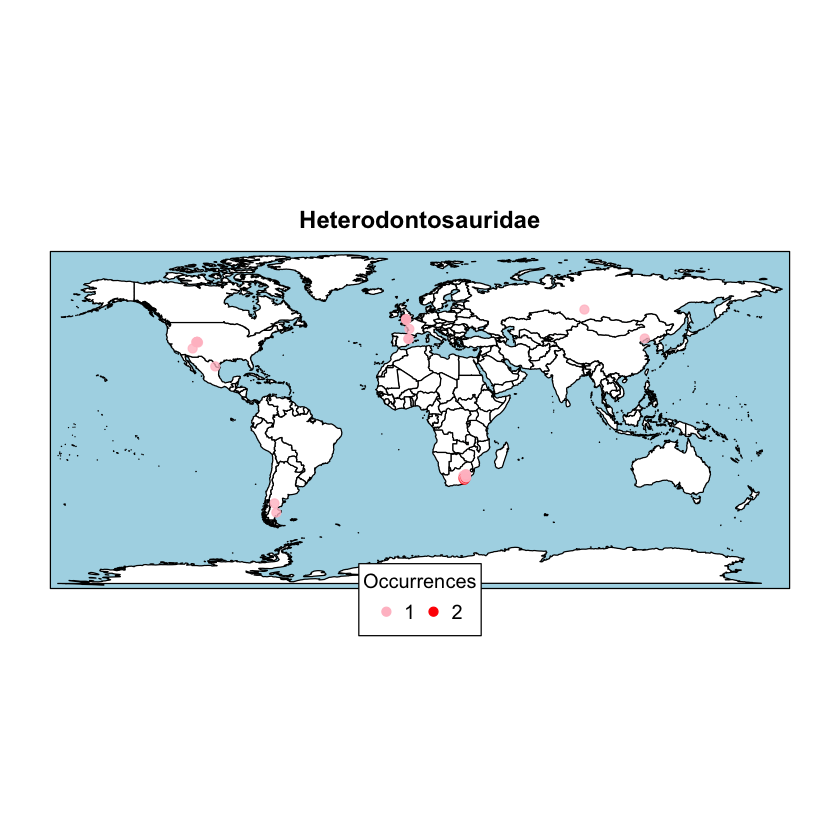

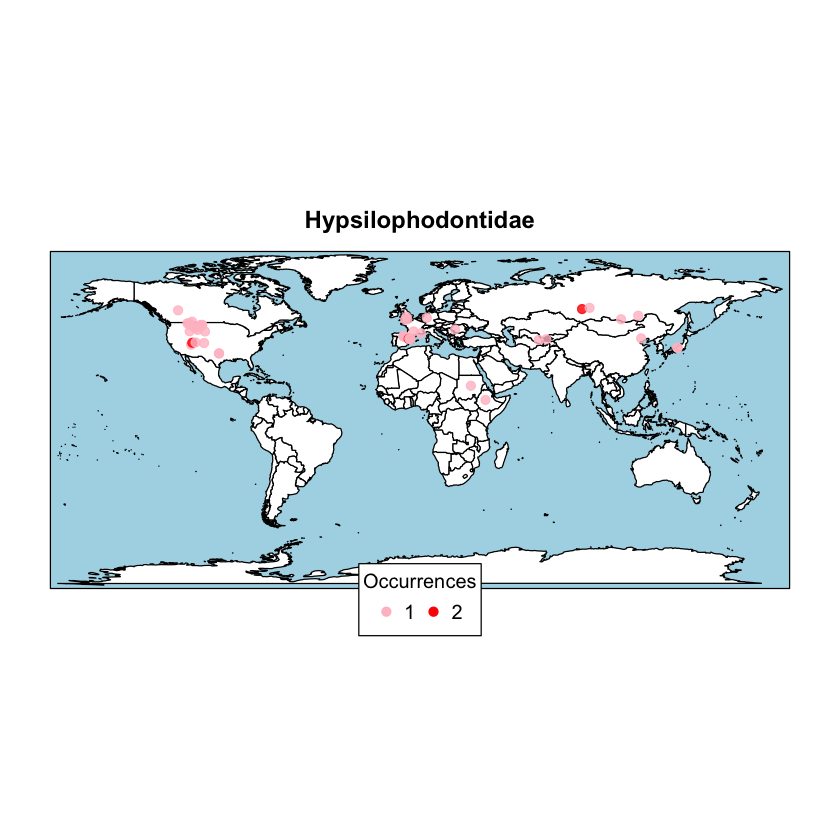

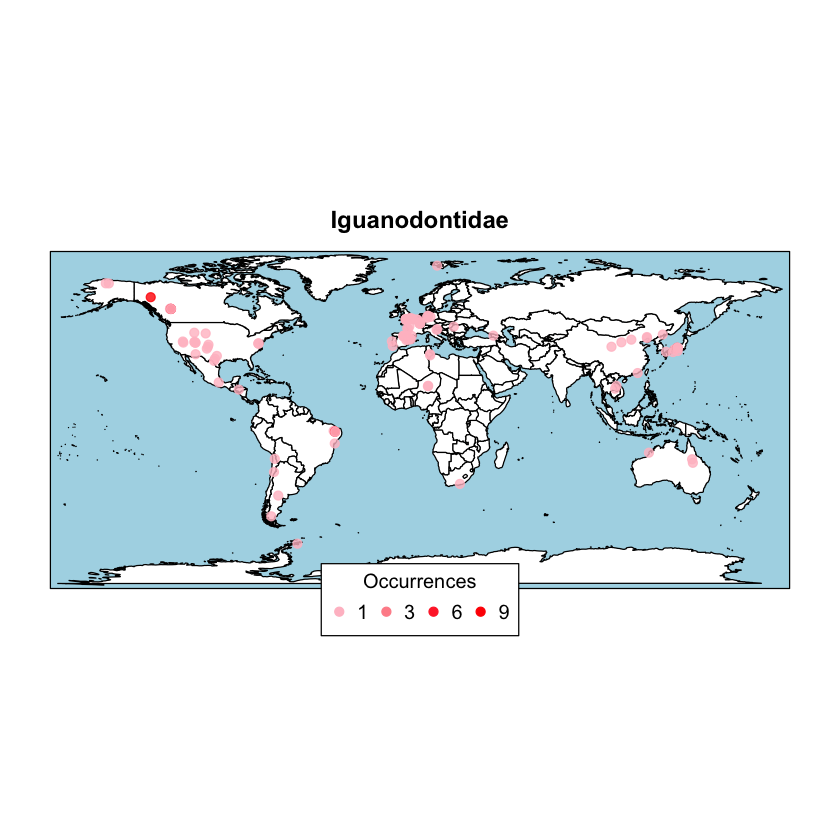

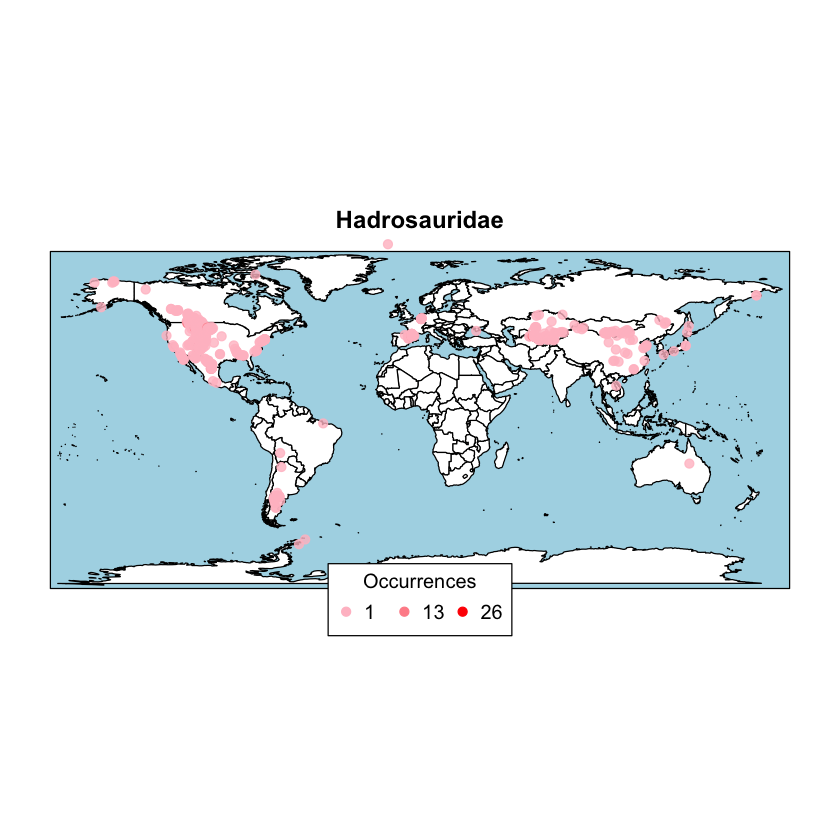

In [9]:
for(i in x){tryCatch(pbdb_map(
    pbdb_occurrences(limit="all",base_name=i, vocab="pbdb",show=c("coords", "phylo", "ident")),
    col.point=c("pink","red"), col.ocean="light blue",main = i),error=function(e){})}


## Get all the dinosaur data


I really wanted to just get all the dinosaur data that the PBDB database had to offer, so I Then call the pbdb_occurrences with the base_name as x so that we can get all the Dinasours occurence data under one variable name as try. 
The base name is the name of a family. The show is 
**Ciera**: Can you explain what each of the arguments mean in this function?

In [10]:
# This takes a while to run
try <- pbdb_occurrences(limit="all", base_name=x, vocab="pbdb", show=c("coords", "phylo", "ident"))
head(try)


,occurrence_no,record_type,collection_no,taxon_name,taxon_rank,taxon_no,matched_name,matched_rank,matched_no,early_interval,⋯,genus,genus_no,family,family_no,order,order_no,species_reso,genus_reso,subgenus_name,subgenus_reso
1:1,41524,occurrence,3257,Aves indet.,class,36616,Aves,class,36616,Early Eocene,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1:2,41580,occurrence,3256,Aves indet.,class,36616,Aves,class,36616,Early Eocene,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1:3,139242,occurrence,11890,Gorgosaurus sternbergi n. sp.,species,63900,Gorgosaurus libratus,species,53194,Late Campanian,⋯,Gorgosaurus,53193,Tyrannosauridae,38606,Avetheropoda,55483,n. sp.,NA,NA,NA
1:4,139249,occurrence,11892,Hadrosauridae indet.,family,38755,Hadrosauridae,family,38755,Late Campanian,⋯,NA,NA,Hadrosauridae,38755,NA,NA,NA,NA,NA,NA
1:5,139250,occurrence,11893,Gorgosaurus libratus,species,53194,Gorgosaurus libratus,species,53194,Late Campanian,⋯,Gorgosaurus,53193,Tyrannosauridae,38606,Avetheropoda,55483,NA,NA,NA,NA
1:6,139251,occurrence,11894,Centrosaurus apertus,species,63911,Centrosaurus apertus,species,63911,Late Campanian,⋯,Centrosaurus,38854,Ceratopsidae,38851,NA,NA,NA,NA,NA,NA


**Ciera**: There are a lot of interesting categories here.  Let's take some time to look at them. How do you know what all the columns mean?  Can you link to the somewhere that gives more information about this data?

In [23]:
#str(try)
#unique(try$early_interval)
length(unique(try$early_interval)) # 227 unique family intervals

## There are alot of families represented 
#unique(try$family)
length(unique(try$family)) # 293 unique time intervals

[1] 227

[1] 293

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


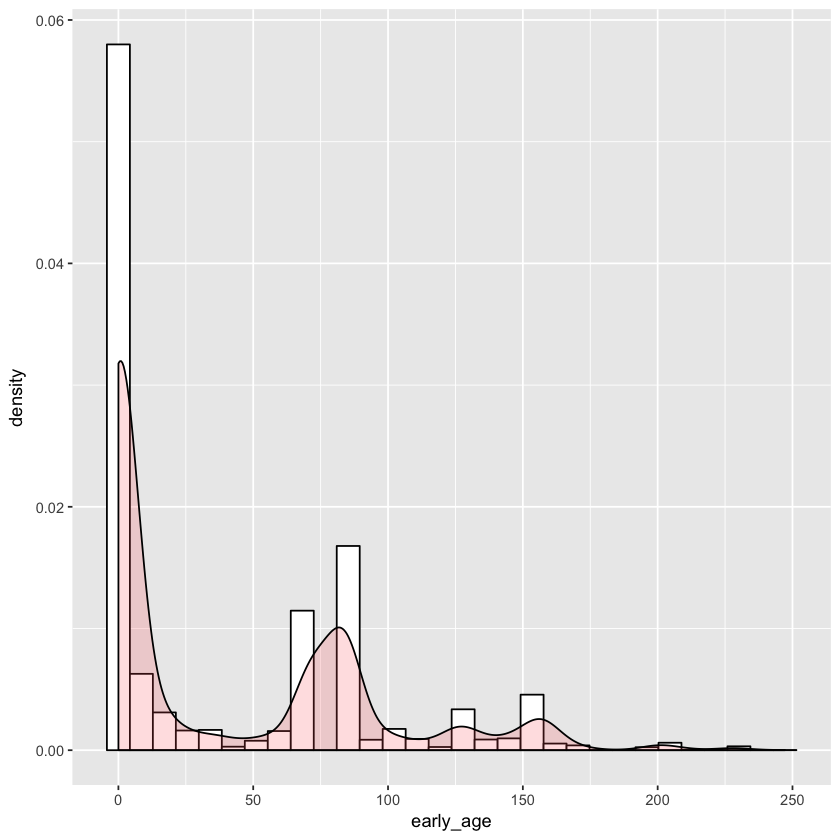

In [24]:


# Looking though age distributions
# is early age intervals in million years ago (mya)? 
try %>% filter(early_age > 0) %>%
ggplot(., aes(x=early_age)) + 
    geom_histogram(aes(y=..density..),      # Histogram with density instead of count on y-axis
                   colour="black", fill="white") +
    geom_density(alpha=.2, fill="#FF6666")  # Overlay with transparent density plot

Warning message:
“Factor `family` contains implicit NA, consider using `forcats::fct_explicit_na`”Selecting by n


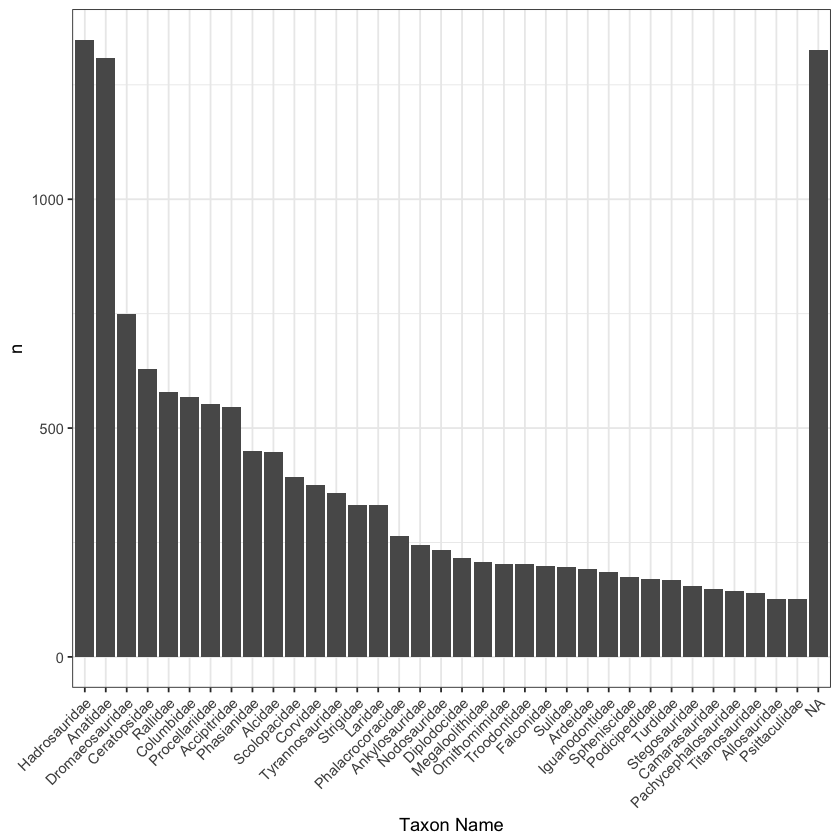

In [25]:
# Top 35 dinosaur families
try %>% 
  count(family) %>% 
  top_n(35) %>%
  ggplot(., aes(x = reorder(family, -n), y = n)) +
    geom_bar(stat = "identity") +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    labs(x = "Taxon Name")

Warning message:
“Factor `family` contains implicit NA, consider using `forcats::fct_explicit_na`”Selecting by n


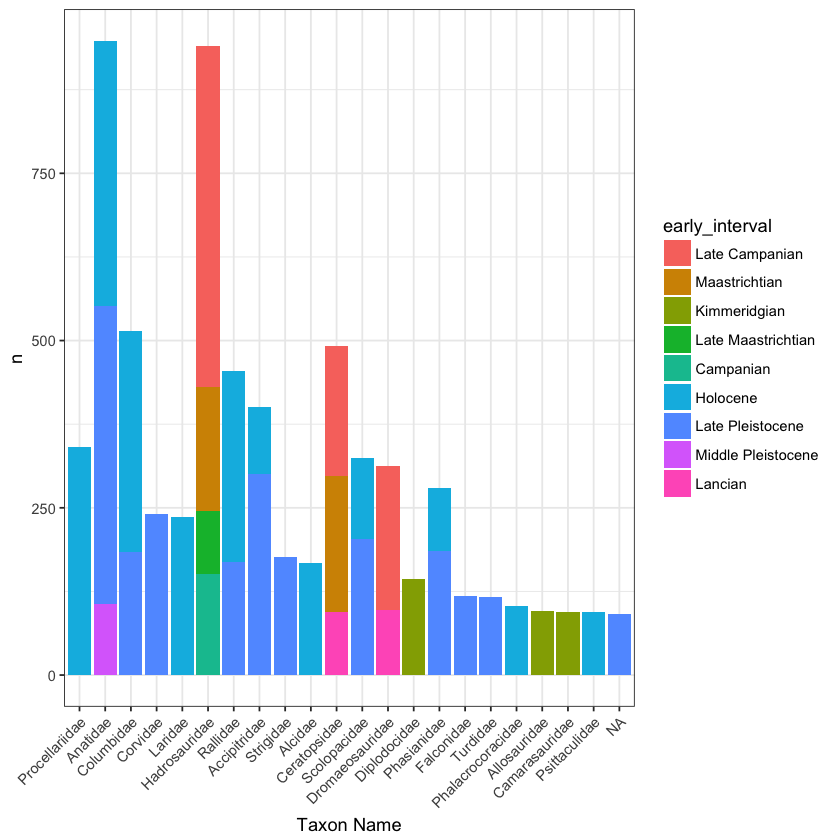

In [26]:
## What are the top dinosaurs in what  taxas and what time periods did they span?

try %>% 
  count(family, early_interval) %>% 
  top_n(35) %>%
  ggplot(., aes(x = reorder(family, -n), y = n, fill = early_interval)) +
    geom_bar(stat = "identity") +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    labs(x = "Taxon Name")

Store the dinasour occurences data locally in a csv form.  

**Ciera**: You did this mostly because you wanted to play with it in python?

In [13]:
## **Ciera** Spelling error, you need to spell this as dinosaurdata.csv, 
write.csv(try, '../data/output/dinasourdata.csv')

According to our try and the visualiztions before, I decide to choose Dromaeosauridae and Tyrannosauridae because they are widely spread and have similar patterns from the North America to Russia and Mongolia. 

Dromaeosauridae is a family of feathered theropod dinosaurs. Wikipedia link https://en.wikipedia.org/wiki/Dromaeosauridae and one introduction from Berkeley http://www.ucmp.berkeley.edu/diapsids/saurischia/dromaeosauridae.html.

![image](../image/velociraptor1_skrep.jpg)

Image from http://www.ucmp.berkeley.edu/diapsids/saurischia/dromaeosauridae.html

Tyrannosauridae (or tyrannosaurids, meaning "tyrant lizards") is a family of coelurosaurian theropod dinosaurs that comprises two subfamilies containing up to thirteen genera, including the eponymous Tyrannosaurus. WikiPedia Link https://en.wikipedia.org/wiki/Tyrannosauridae Also an introduction note from UCBerkeley http://www.ucmp.berkeley.edu/diapsids/saurischia/tyrannosauridae.html
![image](../image/rex_fullview.jpg)
Image from http://www.ucmp.berkeley.edu/diapsids/saurischia/tyrannosauridae.html

For convience, get those two types' occurences from PBDB and save them locally.

In [14]:
Dromaeosauridae = pbdb_occurrences(
    limit="all",base_name='Dromaeosauridae', vocab="pbdb",show=c("coords", "phylo", "ident"))
Tyrannosauridae = pbdb_occurrences(
    limit="all",base_name='Tyrannosauridae', vocab="pbdb",show=c("coords", "phylo", "ident"))

write.csv(Dromaeosauridae, '../data/output/Dromaeosauridae.csv')

write.csv(Tyrannosauridae, '../data/output/Tyrannosauridae.csv')

Visualzie the Dromaeosauridae's occurence data.

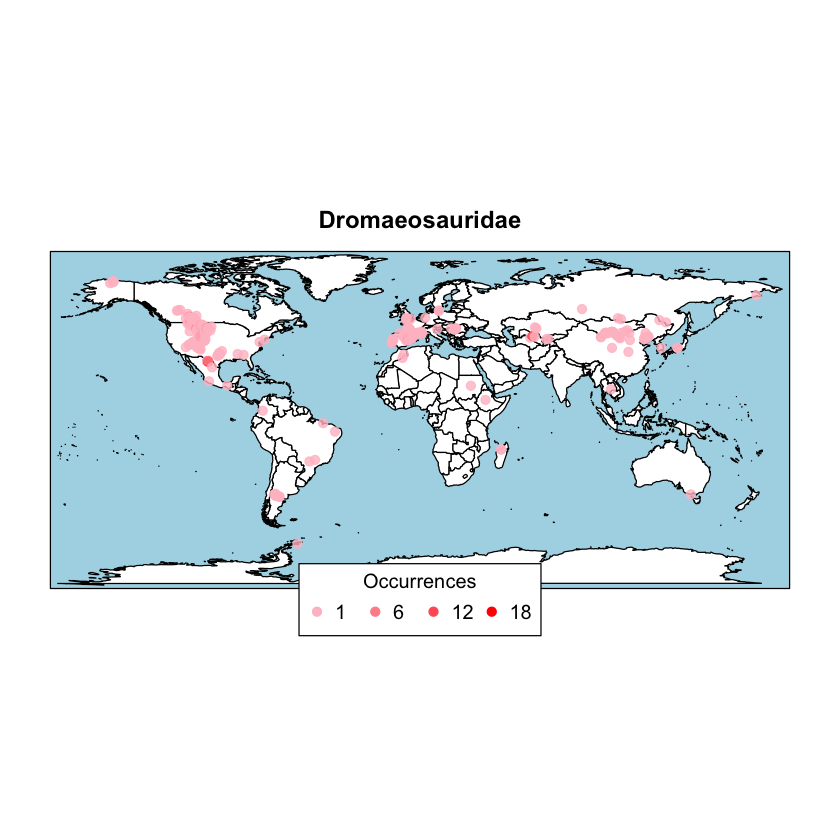

In [15]:
pbdb_map(Dromaeosauridae,col.point=c("pink","red"), col.ocean="light blue", main='Dromaeosauridae')

Visualzie the Tyrannosauridae's occurence data.

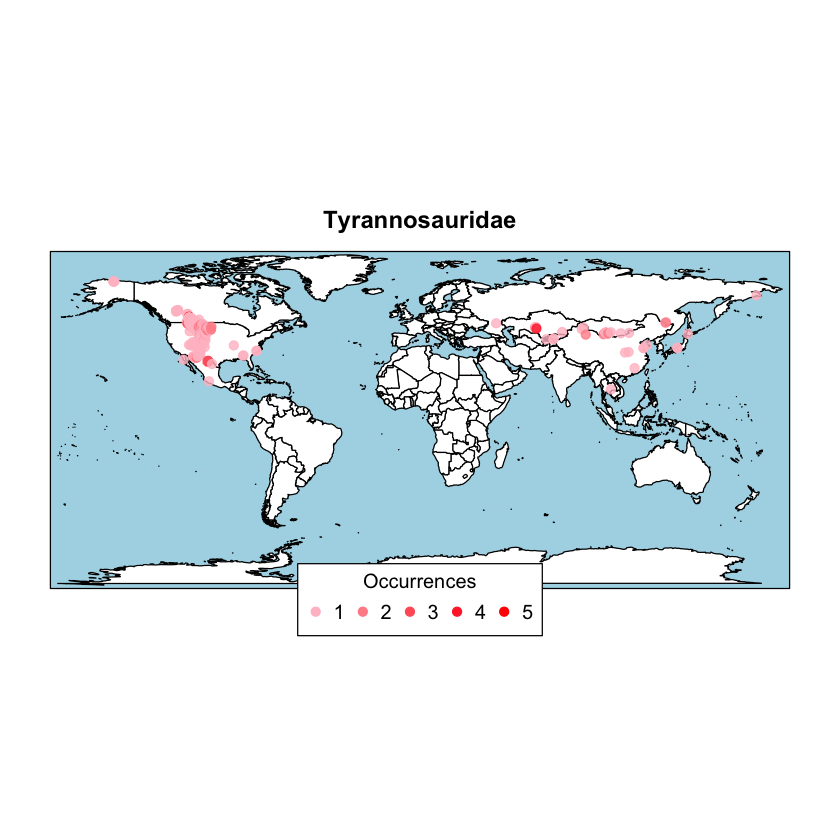

In [16]:
pbdb_map(Tyrannosauridae,col.point=c("pink","red"), col.ocean="light blue", main='Tyrannosauridae')

After doing this data retrieving, we are going to python notebook and pbdb site to find out their occurence timeline so the migration routine can be known. 

This is an interesting intereactive earth and its continent changes druing geological time. https://www.smithsonianmag.com/science-nature/travel-through-deep-time-interactive-earth-180952886/
![image]("../image/earth.jpg")
This is how earth looks like during Jurassic time, which is the closet time we can find when our two dinasour familes are most active.

![image](../image/136145-050-0AC28C9A.jpg)
This is how earth looks like in the late Jurrasic.

![image](../image/136144-050-200CA3A5.jpg)
This is how earth looks like in the Crtecaous.
These two images are from https://www.britannica.com/science/

![image](../image/D1.jpg)
![image](../image/D2.jpg)
On pbdb's website, we can find that Dromaeosauridae are originated in North America and South Europe during J. Then they are wide spread to Russia and Asia During C.

![image](../image/T1.jpg)
![image](../image/T2.jpg)
On pbdb's website, we can find that Tyrannosauridae are originated in North America and Middle Asia during late C. Then they are wide spread to Russia,Asia and America in later times.

I am going to use python to do some analysis about the time line of our two dinasour specieces and further researches.

When we reach here, we need to go to the python notebook to generate the time based categoried species.

After running the python notebook, now we have a lot of categorized data files.We are gonna visualize them using pdbd_map

Lets get back to our visualization. We use r read the data frames first; then we are able to do some interesting stuff with a lot of graphs.

In [17]:
# read the data
Tyrannosauridae_timed <- read.csv('../data/output/Tyrannosauridae.csv', header = TRUE, sep = ",", quote = "\"",
         dec = ".", fill = TRUE, comment.char = "")
Dromaeosauridae_timed <- read.csv('../data/output/Dromaeosauridae.csv', header = TRUE, sep = ",", quote = "\"",
         dec = ".", fill = TRUE, comment.char = "")

The list of all late intervals
PS: The smaller the numbers are, the closer to our current age. So the later the species apperas.

In [18]:
early_age_of_Tyrannosauridae <-unique(sort(Tyrannosauridae_timed$early_age, decreasing = TRUE))
early_age_of_Dromaeosauridae <-unique(sort(Dromaeosauridae_timed$early_age, decreasing = TRUE))

Install a package to use filter which is a very function for analyzing
This is a link which introduces this package https://uc-r.github.io/dplyr

In [19]:
install.packages("dplyr")
library(dplyr)



The downloaded binary packages are in
	/var/folders/c3/bzm4vh_91zdbl5wz5zt4wn200000gn/T//RtmpKDdgPD/downloaded_packages



Attaching package: ‘dplyr’

The following objects are masked from ‘package:raster’:

    intersect, select, union

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



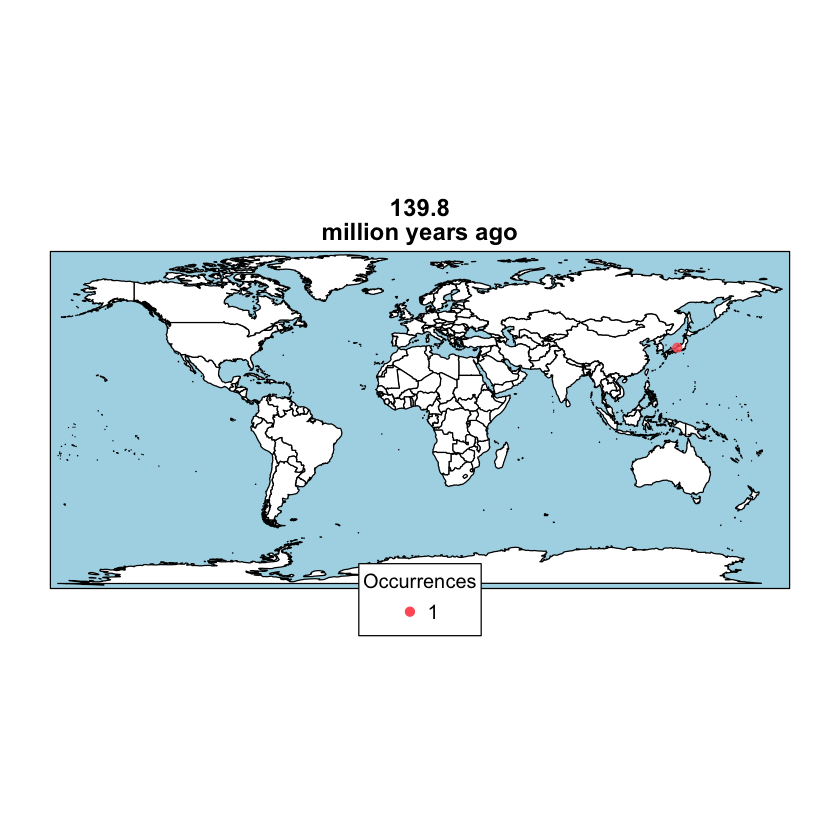

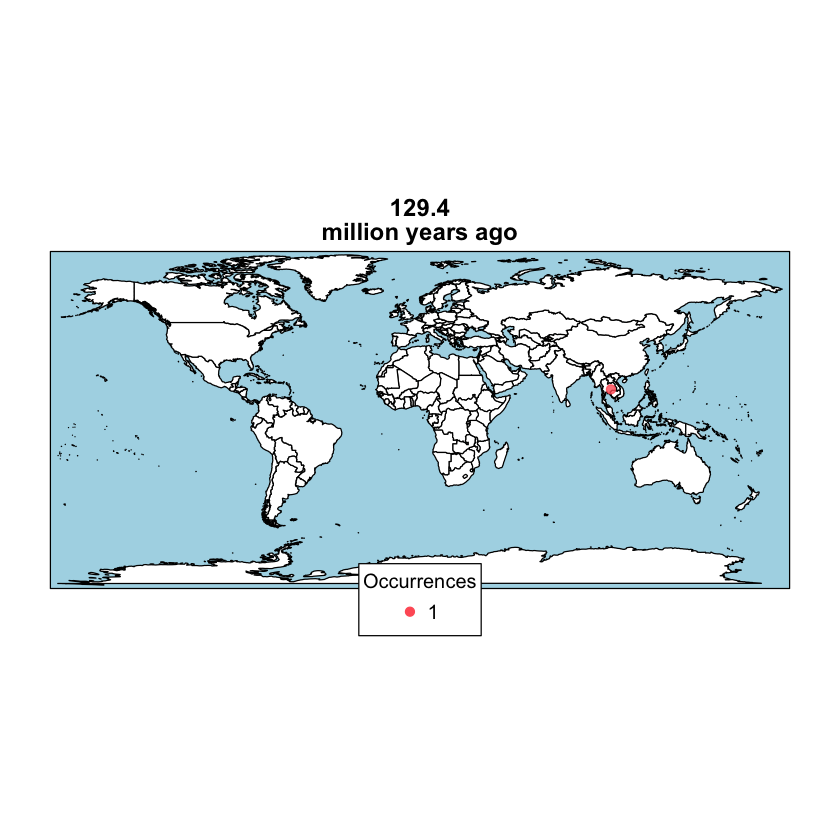

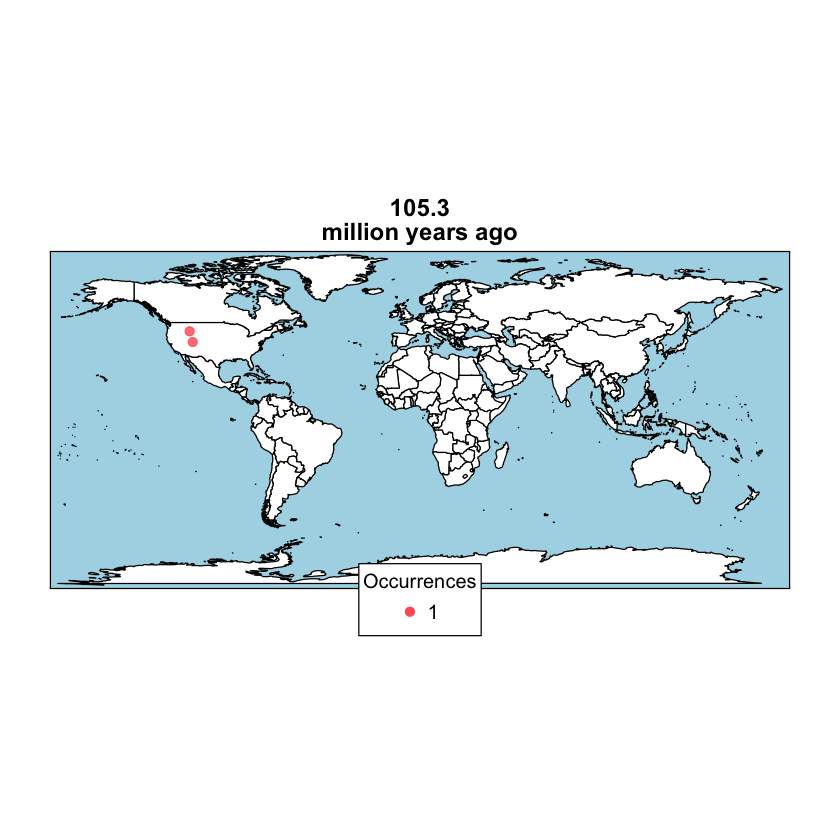

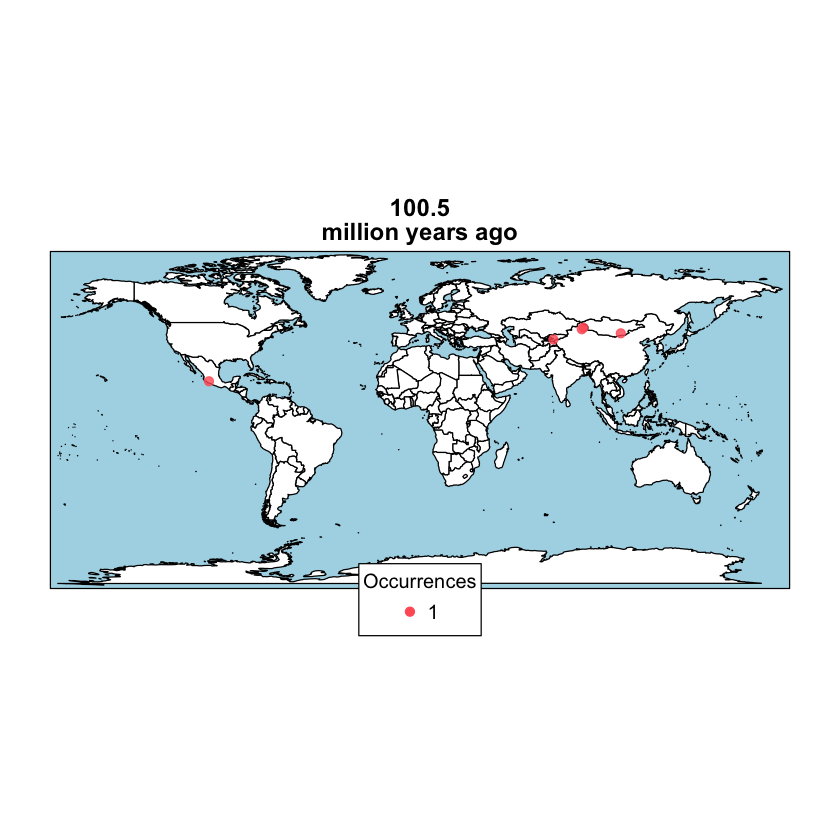

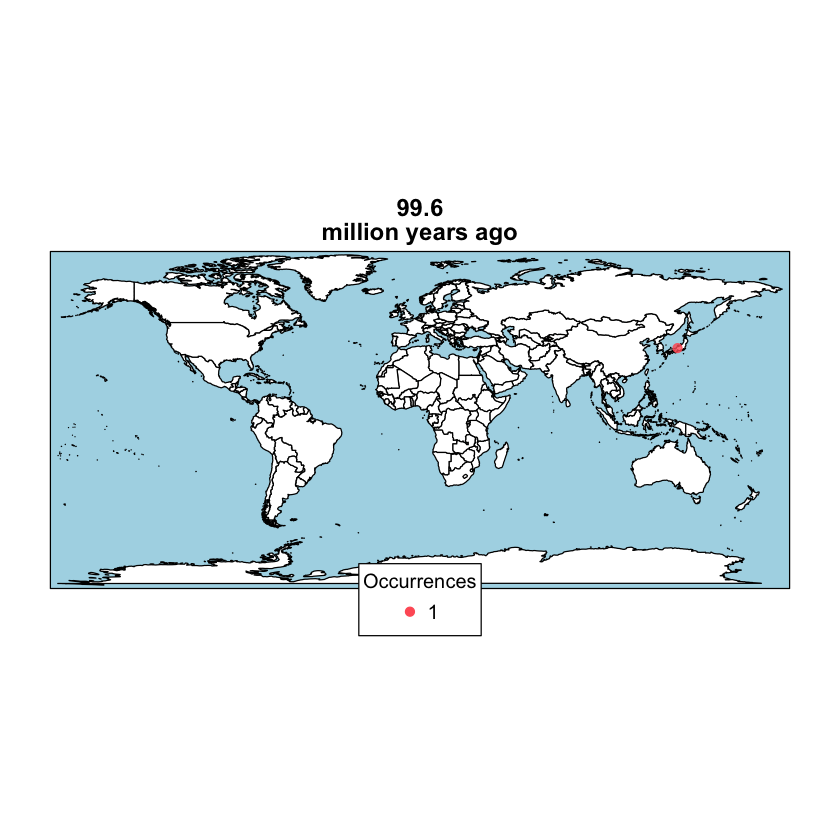

...

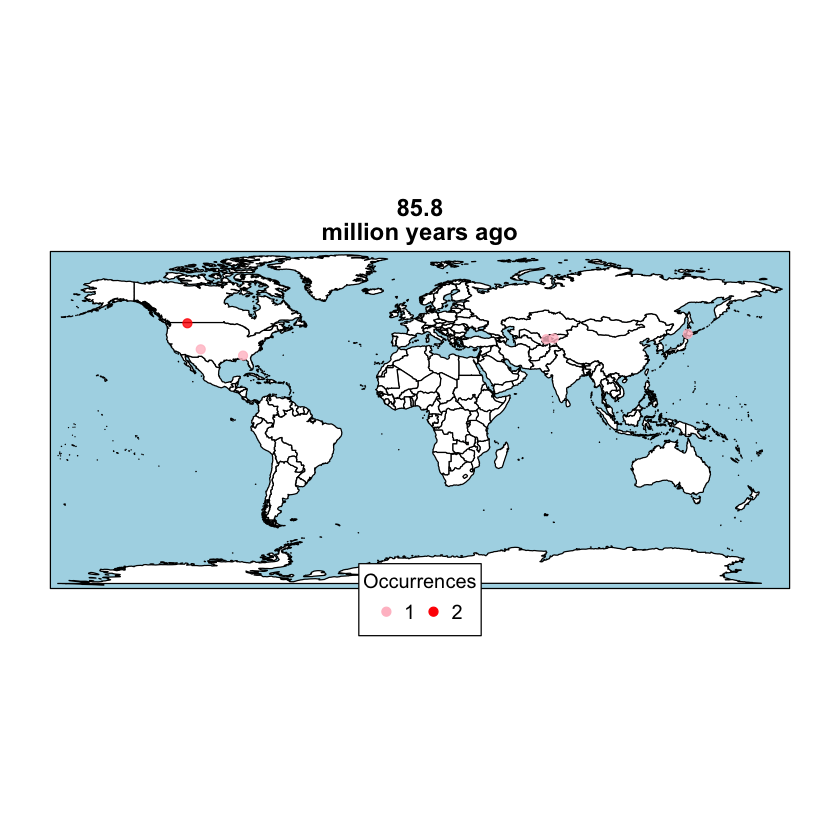

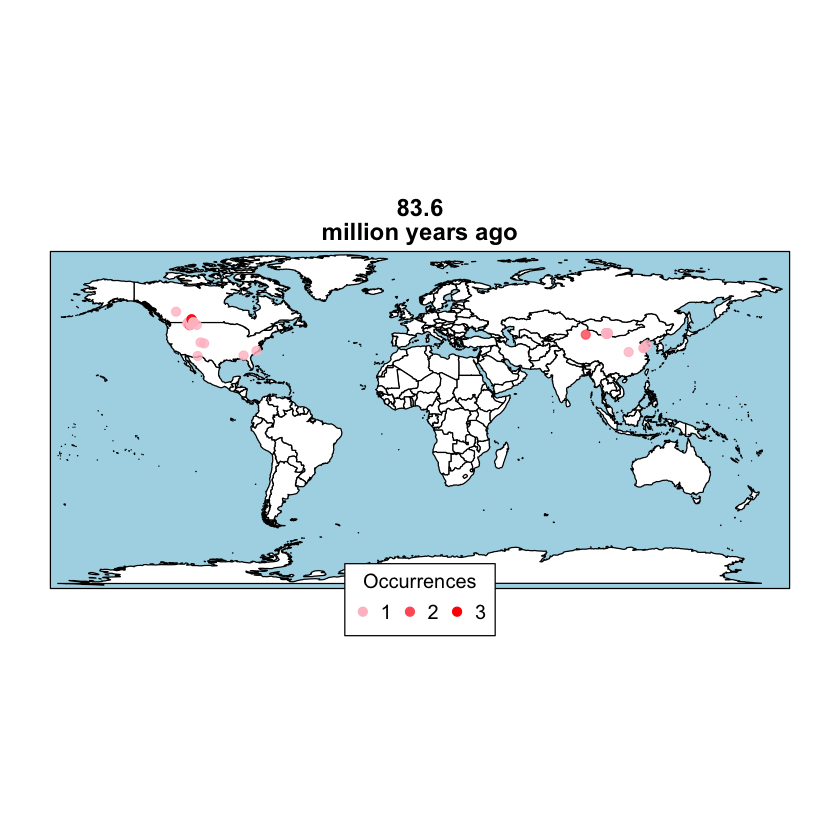

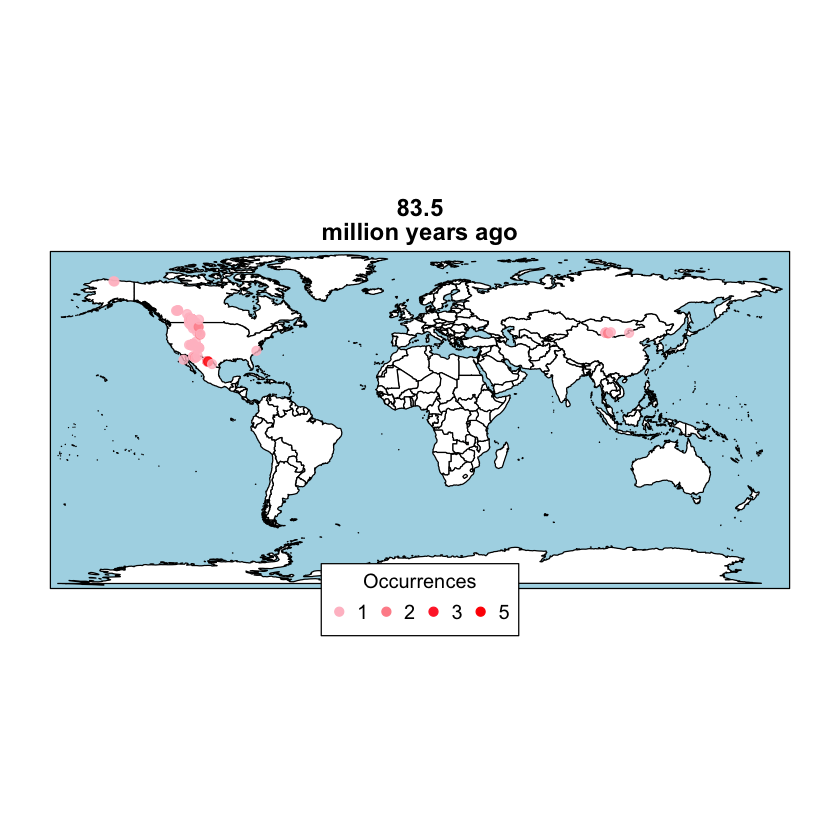

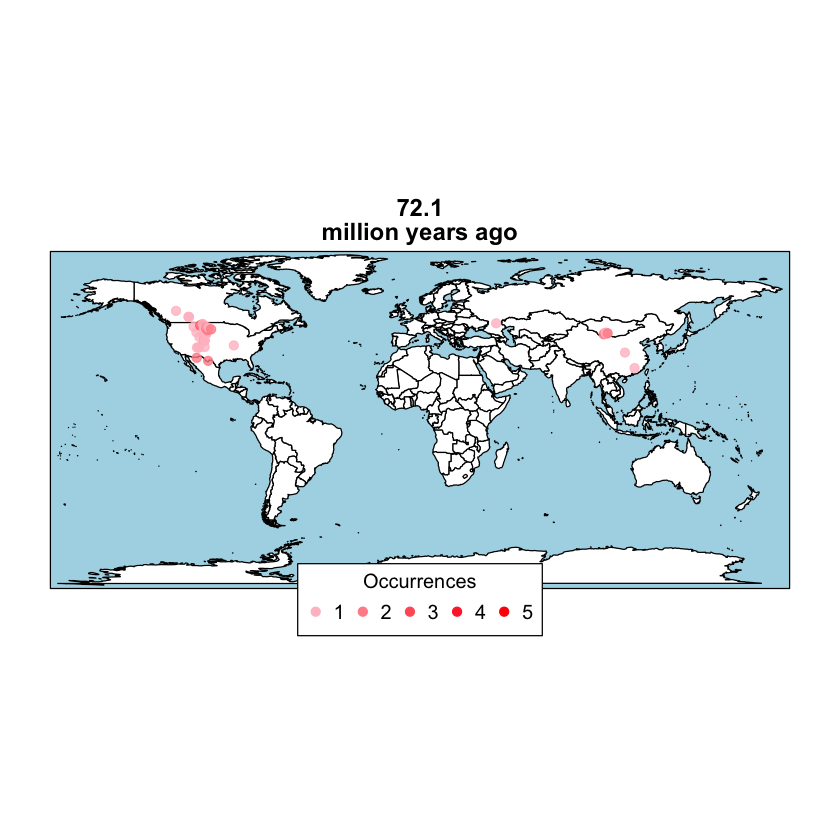

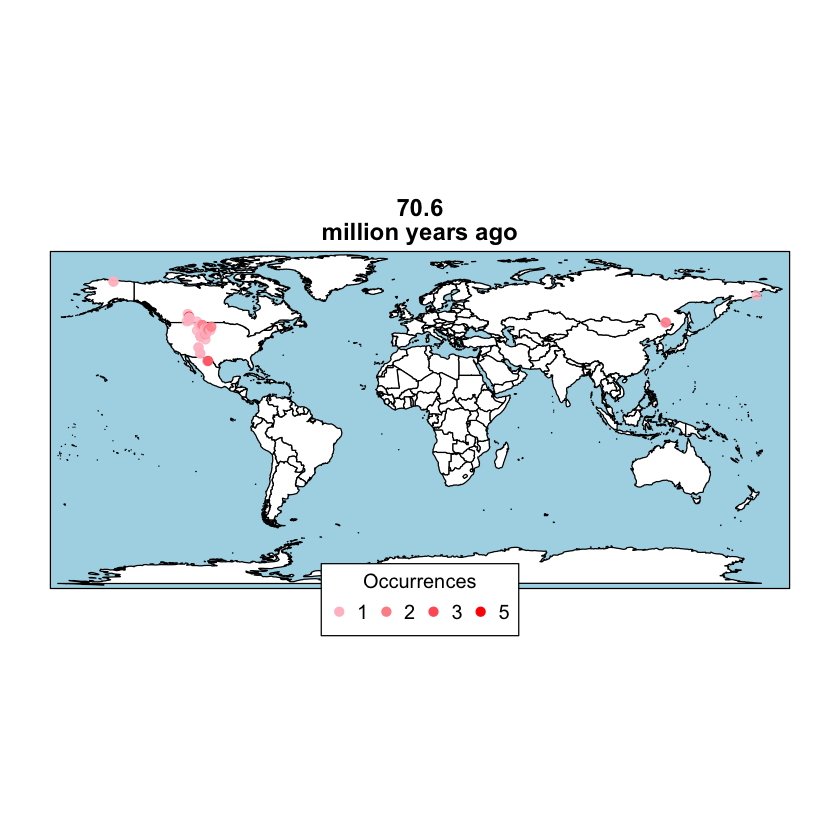

In [20]:
for (i in early_age_of_Tyrannosauridae){ 
pbdb_map(
    pbdb_occurrences(limit="all",id=filter(Tyrannosauridae_timed, early_age == i)[,2], vocab="pbdb",show=c("coords", "phylo", "ident")),
    col.point=c("pink","red"), col.ocean="light blue", main= c(i,'million years ago'))}

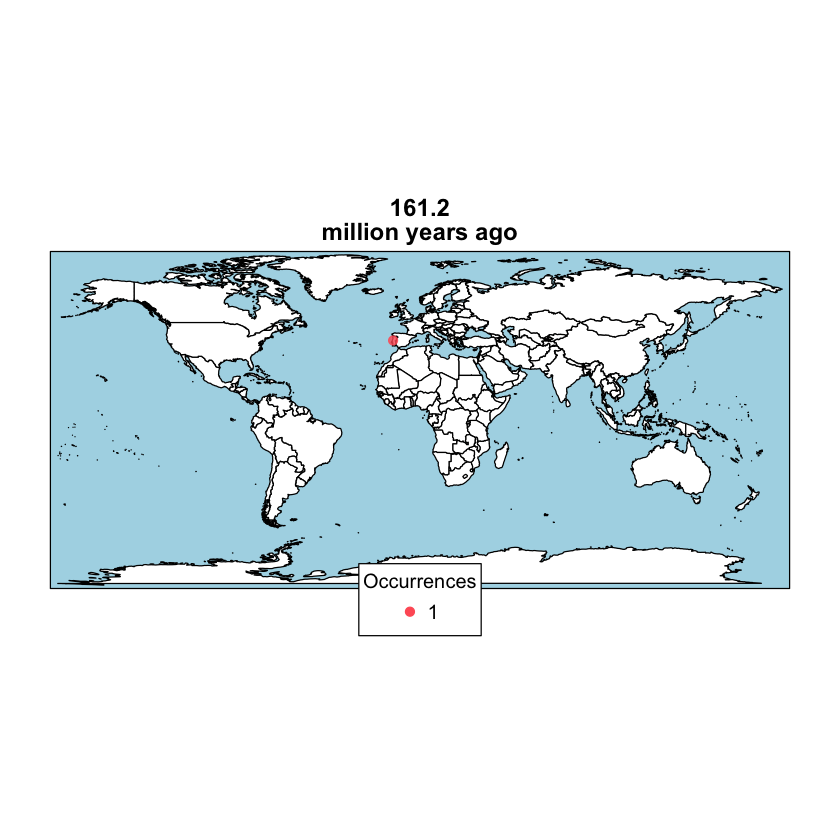

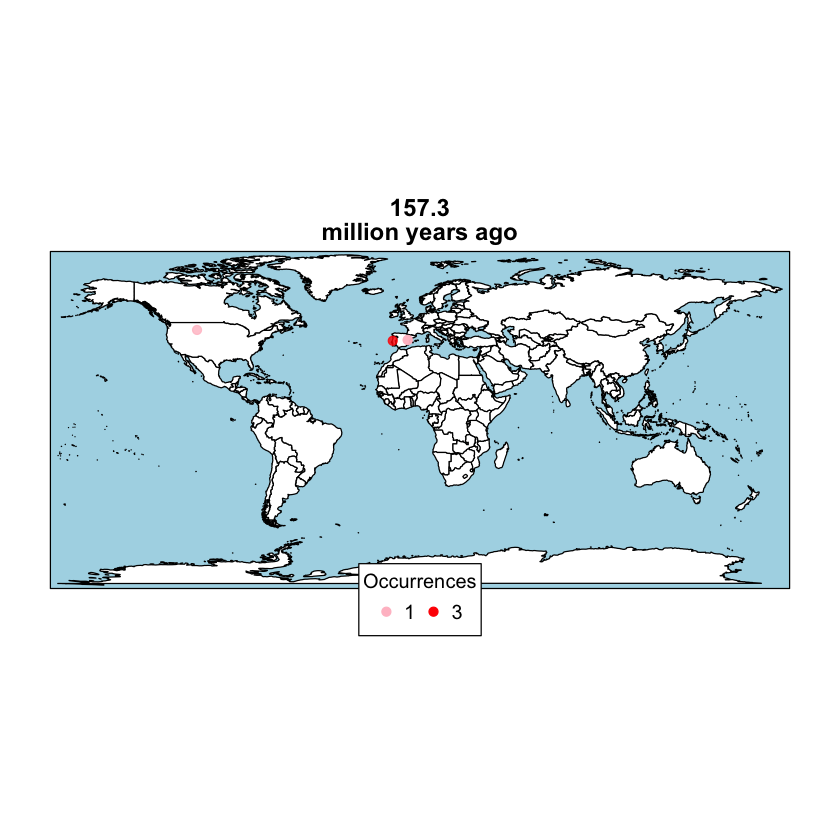

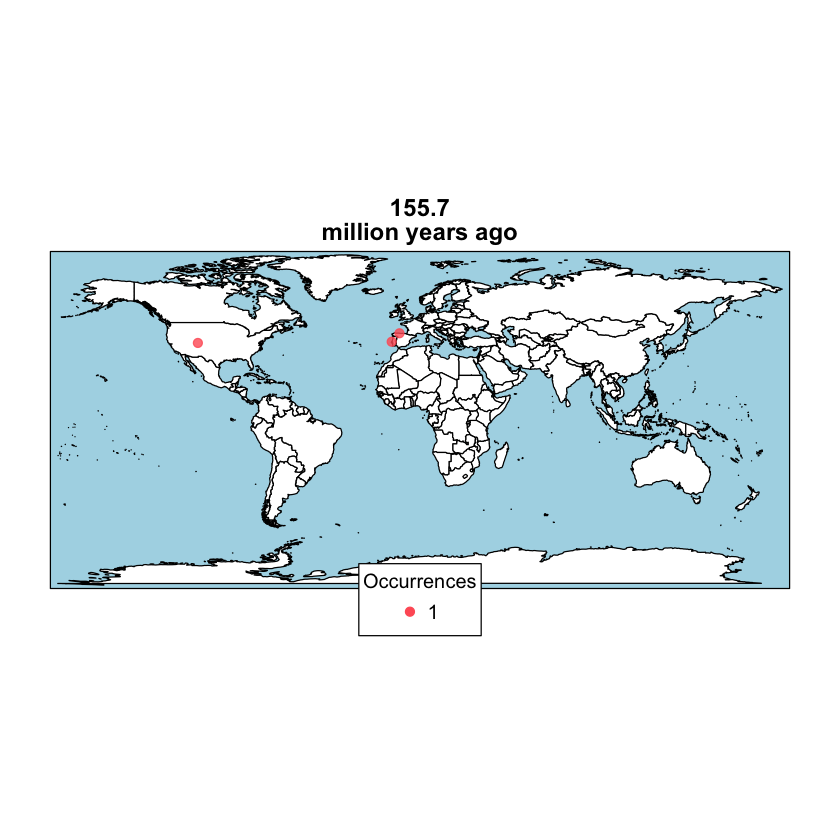

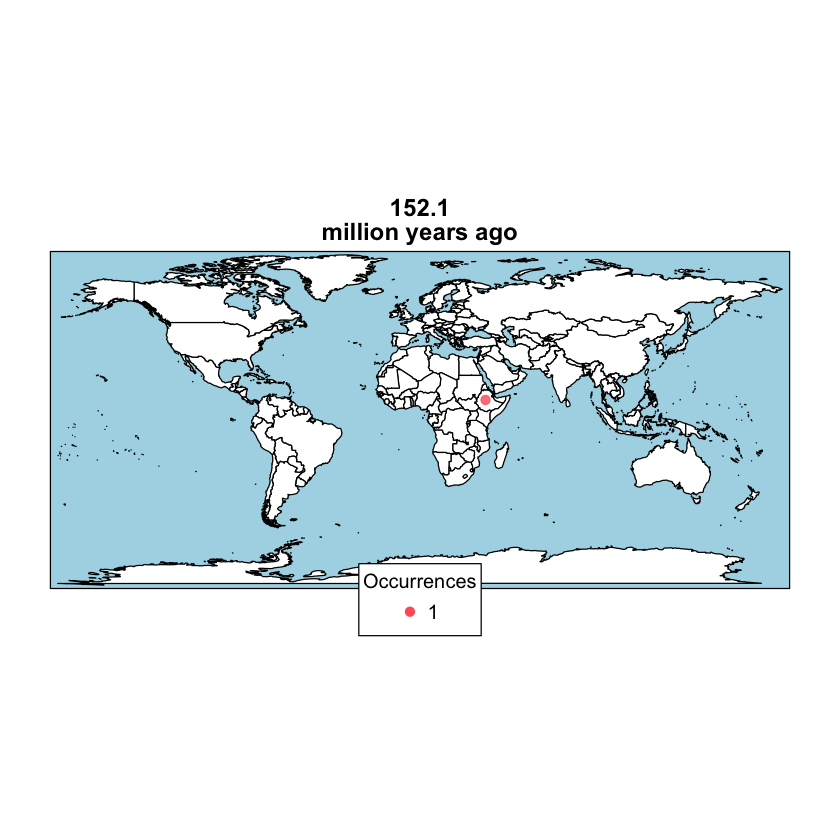

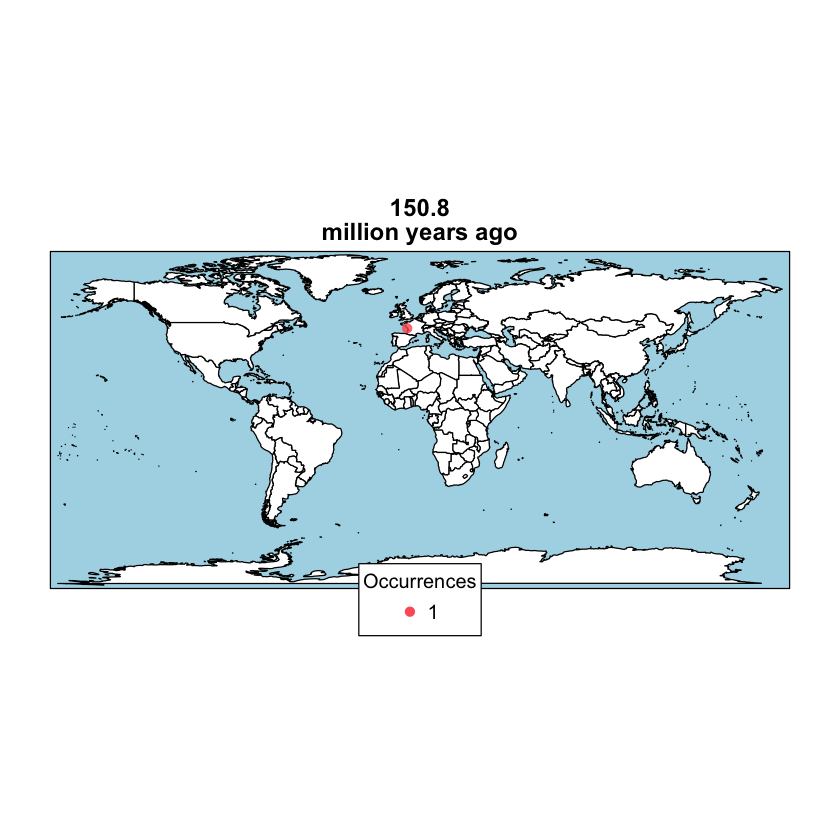

...

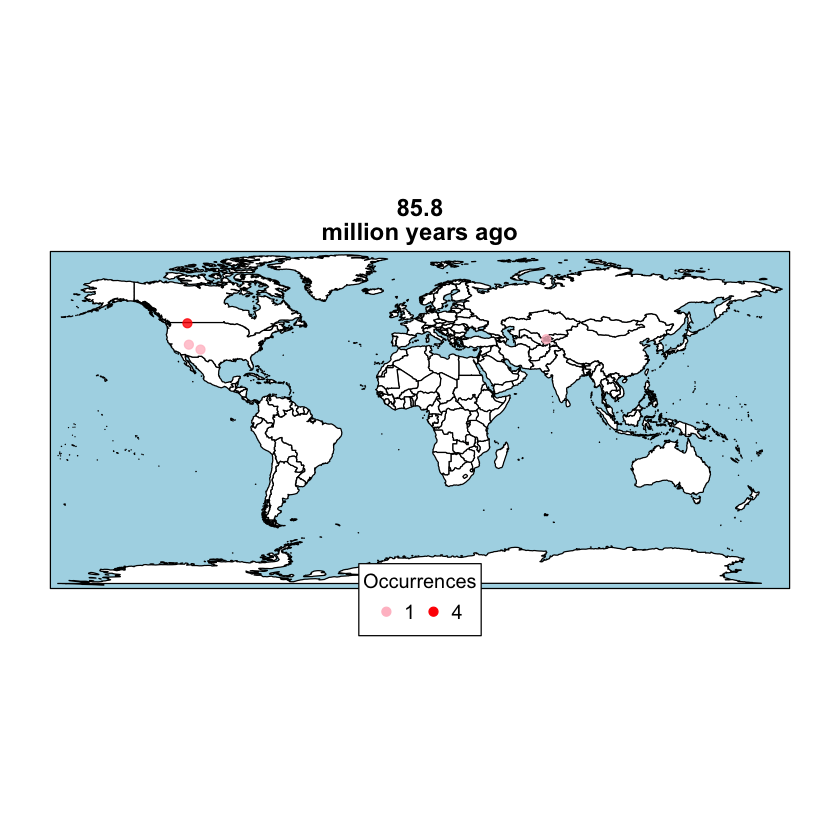

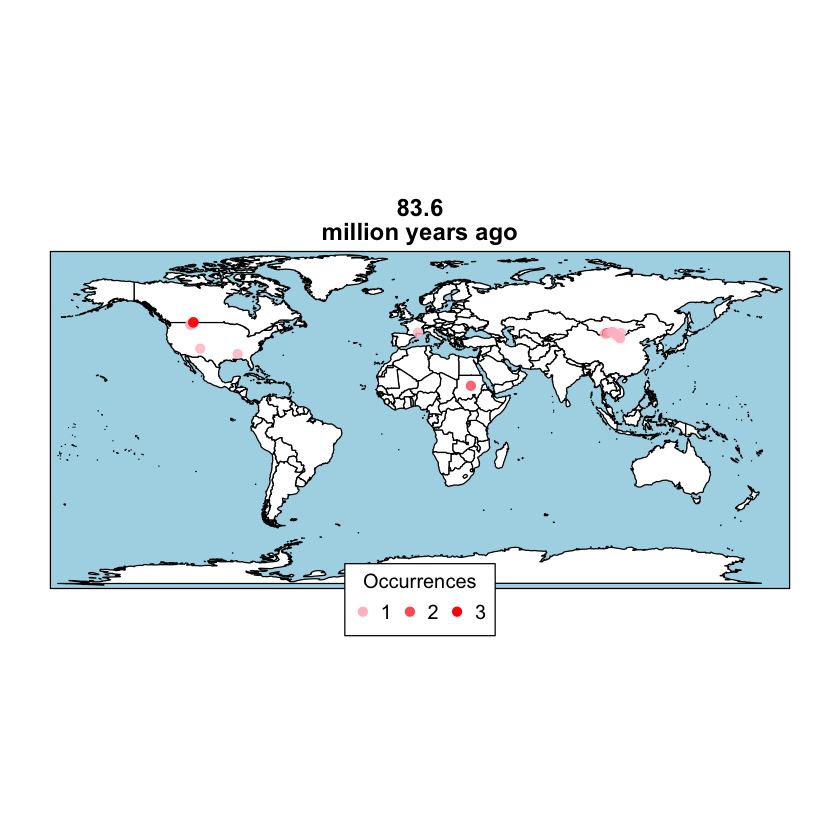

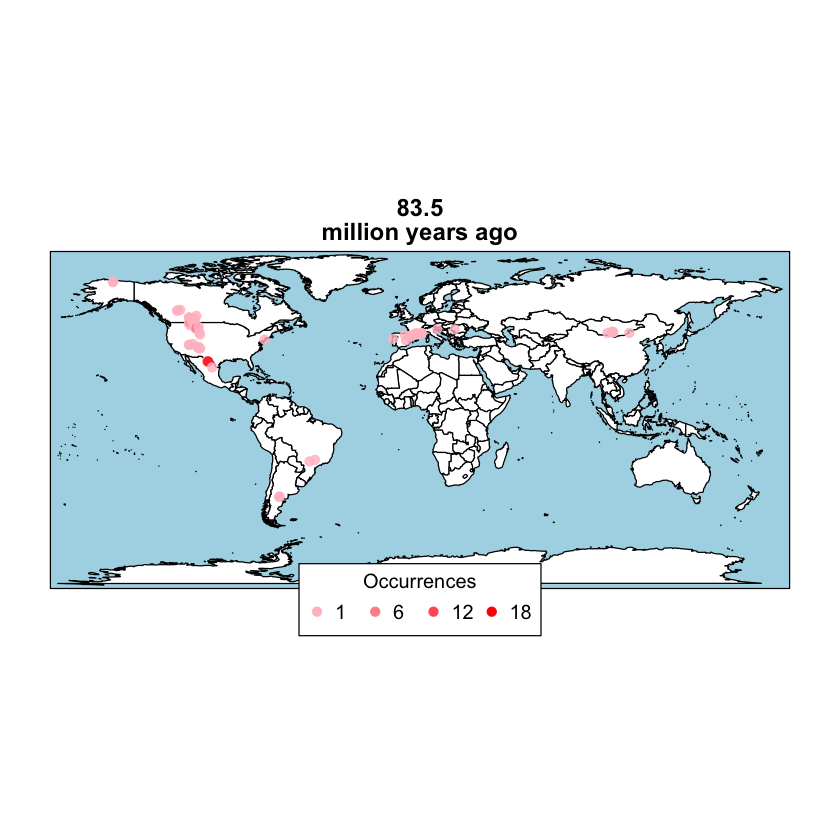

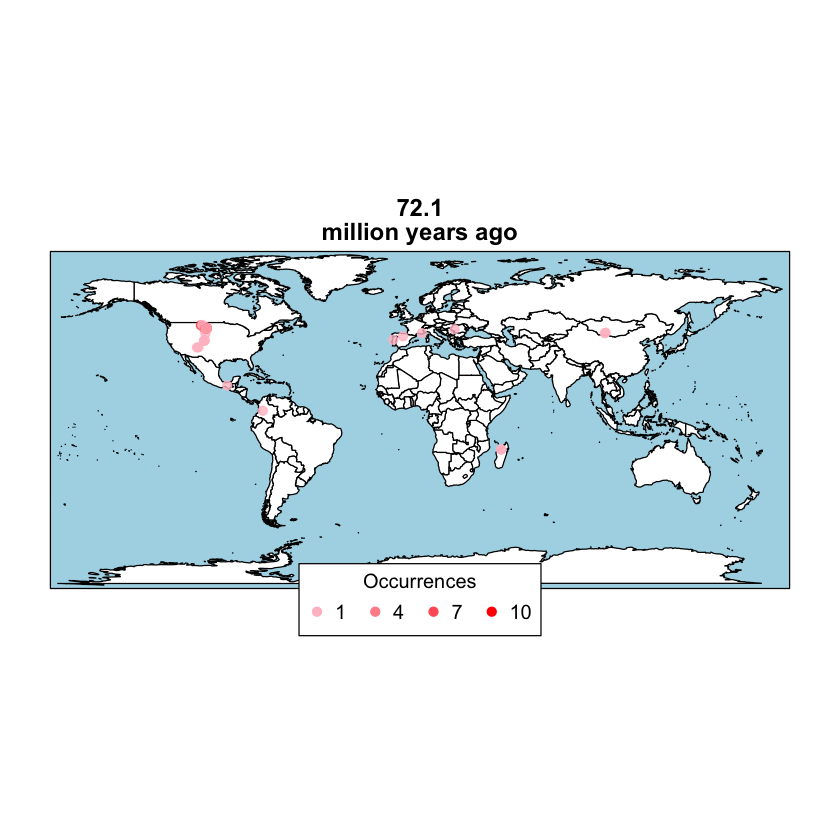

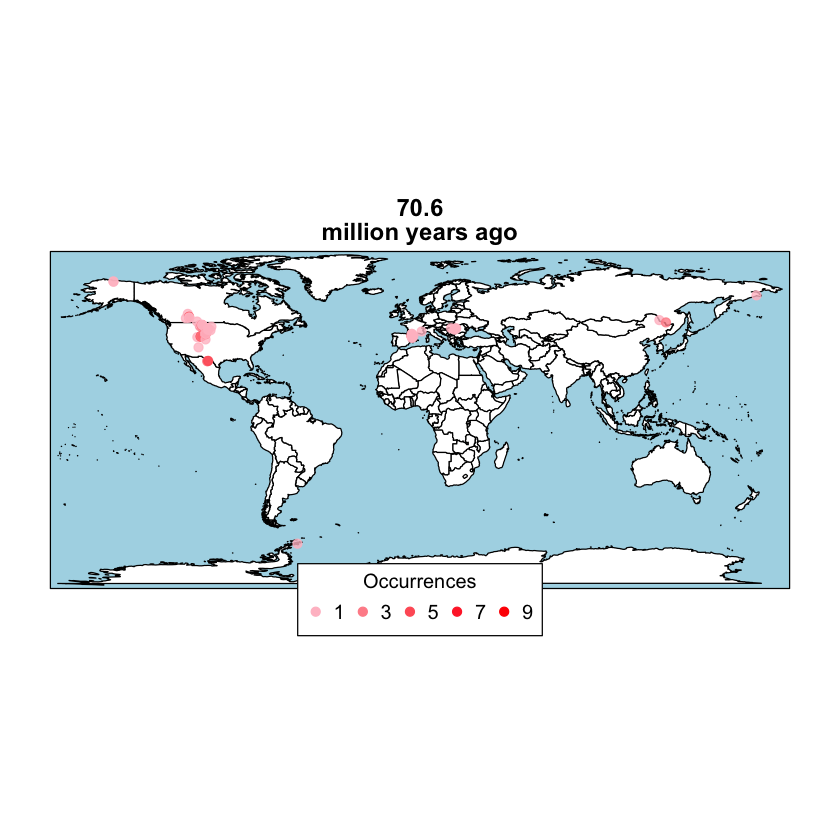

In [21]:
for (i in early_age_of_Dromaeosauridae){ 
pbdb_map(
    pbdb_occurrences(limit="all",id=filter(Dromaeosauridae_timed, early_age == i)[,2], vocab="pbdb",show=c("coords", "phylo", "ident")),
    col.point=c("pink","red"), col.ocean="light blue", main= c(i,'million years ago'))}

This is the link which provides the link from early age to geological time period. https://en.wikipedia.org/wiki/Cenomanian

This is a great site which provides the visualization of geological transitions ovettime. 
http://portal.gplates.org/

# Conclusion

What to write...

See the done meaning we are done with running all the cells and no errors occured. Congratulations on me!

In [22]:
print('Done!')

[1] "Done!"


This is a very exiciting project! The most important part I learned through this process is 